In [1]:
import pandas as pd

df = pd.read_parquet("hf://datasets/HazemAbdelkawy/emotions/train-00000-of-00001.parquet")

c:\Users\yardz\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df.head()

,image,question,answer
0,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,How does the person feel in the image?,sad
1,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,How does the person feel in the image?,anger
2,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,How does the person feel in the image?,neutral
3,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,How does the person feel in the image?,fear
4,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,How does the person feel in the image?,content


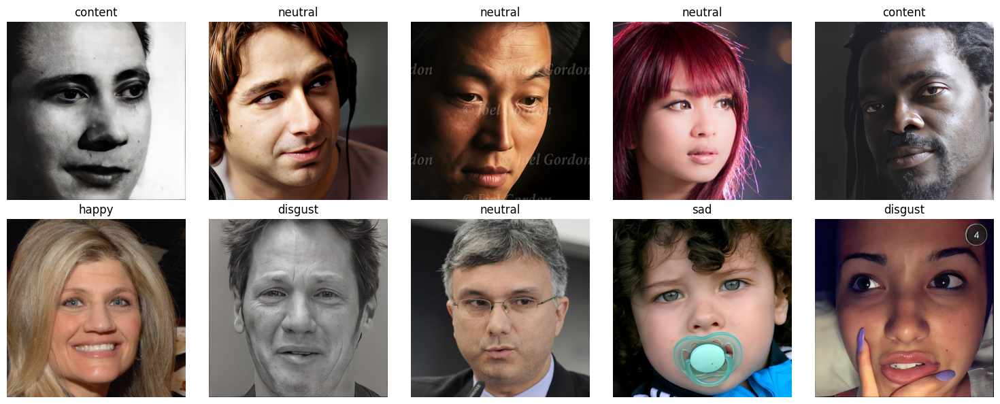

In [3]:
import numpy as np
from PIL import Image
import io
import mediapipe as mp

import matplotlib.pyplot as plt

sample = df.sample(10, random_state=42)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.flatten()

for ax, (_, row) in zip(axes, sample.iterrows()):
    img_bytes = row['image']['bytes']
    img = Image.open(io.BytesIO(img_bytes))
    img_np = np.array(img)
    ax.imshow(img_np)
    ax.set_title(row['answer'])
    ax.axis('off')

plt.tight_layout()
plt.show()

In [4]:
import matplotlib.pyplot as plt

def show_image(img):
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [5]:
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import pickle
import cv2
import numpy as np

# 1. Завантаження моделі для облич
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
mp_face_detection = mp.solutions.face_detection

# 2. Зчитування та кодування міток
le = LabelEncoder()
enc_lab = le.fit_transform(df['answer'])
with open('label_encoder.pkl', 'wb') as f:
    pickle.dump(le, f)

image_bytes = [img_dict['bytes'] for img_dict in df['image']]

# 3. Split
X_train, X_val, y_train, y_val = train_test_split(image_bytes, enc_lab, test_size=0.2, random_state=42, stratify=enc_lab)

# 4. Функція для обрізки
def crop_and_resize(byte_str):
    with mp_face_detection.FaceDetection(model_selection=0, min_detection_confidence=0.5) as face_detection:
    
        img_array = tf.io.decode_image(byte_str)
        img = img_array.numpy()
        H, W, _ = img.shape

        face = face_detection.process(img)
        if face.detections:
            location_data = face.detections[0].location_data
            bbox = location_data.relative_bounding_box
            x1, y1, w, h = bbox.xmin, bbox.ymin, bbox.width, bbox.height
            
            x1 = int(x1 * W)
            y1 = int(y1 * H)
            w = int(w * W)
            h = int(h * H)
            
            face_region = img[y1:y1 + h, x1:x1 + w, :].copy()
            resized = cv2.resize(face_region, (122, 122))
            return resized.astype(np.float32) # / 255
        else:
            print("zxc")
            return np.zeros((122, 122, 3), dtype=np.float32)

# 5. Серіалізація для TFRecord
def serialize_example(image, label):
    image_raw = tf.io.serialize_tensor(image).numpy()
    feature = {
        'image': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_raw])),
        'label': tf.train.Feature(int64_list=tf.train.Int64List(value=[label]))
    }
    return tf.train.Example(features=tf.train.Features(feature=feature)).SerializeToString()

# 6. Запис у .tfrecord
def write_tfrecord(filename, X, y):
    k = 0
    
    with tf.io.TFRecordWriter(filename) as writer:
        for byte_str, label in zip(X, y):
            try:
                image = crop_and_resize(byte_str)
                example = serialize_example(image, label)
                writer.write(example)
            except Exception as e:
                print(byte_str)
                print(f"Помилка на зображенні: {e}")
                k+=1
        print(k)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


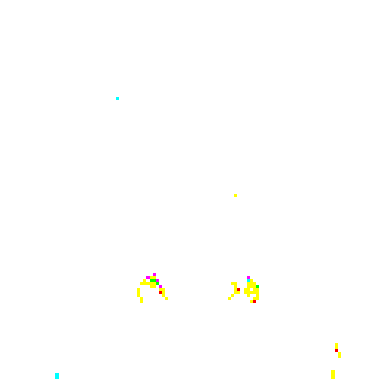

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..248.0].


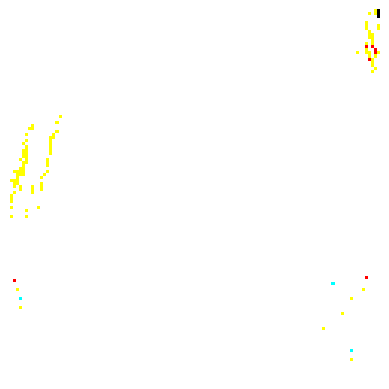

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..253.0].


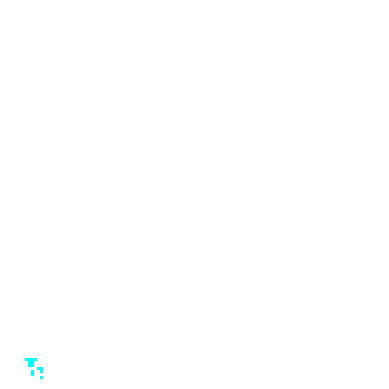

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..218.0].


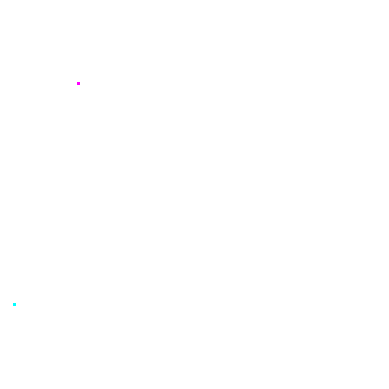

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.0].


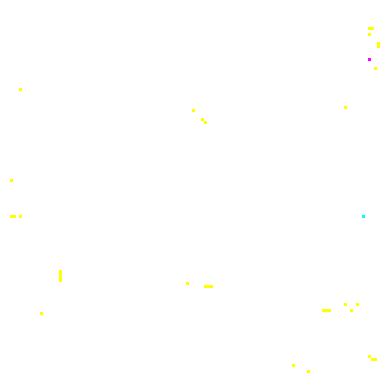

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


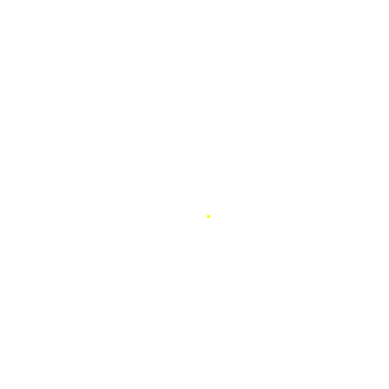

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


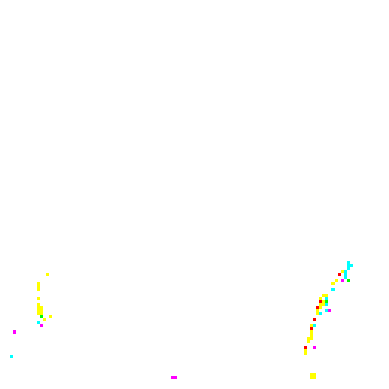

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..232.0].


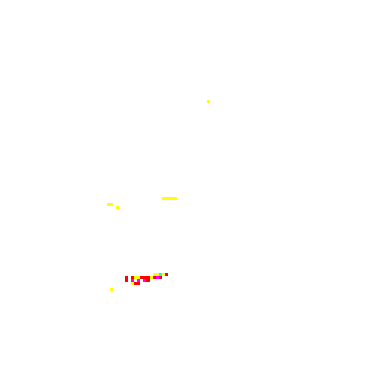

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [5.0..255.0].


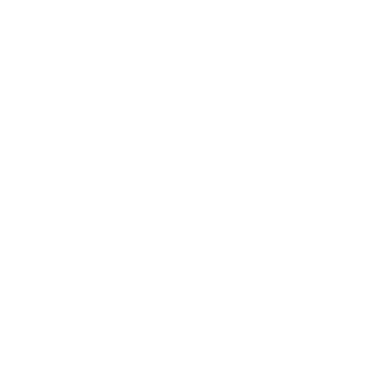

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


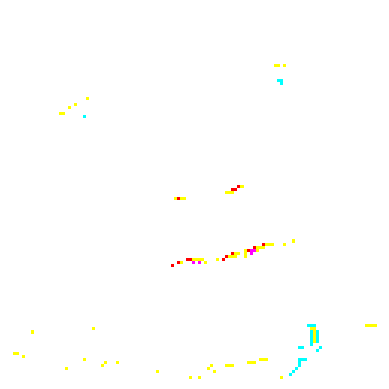

In [6]:
from random import randint
for _ in range(10):
    show_image(crop_and_resize(df['image'][randint(0, 5000)]['bytes']))

In [7]:
write_tfrecord("trainft.tfrecord", X_train, y_train)
write_tfrecord("valft.tfrecord", X_val, y_val)

b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x08\x06\x06\x07\x06\x05\x08\x07\x07\x07\t\t\x08\n\x0c\x14\r\x0c\x0b\x0b\x0c\x19\x12\x13\x0f\x14\x1d\x1a\x1f\x1e\x1d\x1a\x1c\x1c $.\' ",#\x1c\x1c(7),01444\x1f\'9=82<.342\xff\xdb\x00C\x01\t\t\t\x0c\x0b\x0c\x18\r\r\x182!\x1c!22222222222222222222222222222222222222222222222222\xff\xc0\x00\x11\x08\x02\x80\x02\x80\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca\xd2\xd3\

In [8]:
import matplotlib.pyplot as plt

def plot_label_distribution(new_df):
    labels = new_df['label']
    plt.figure(figsize=(6, 4))
    plt.hist(labels, bins=len(np.unique(labels)), rwidth=0.8)
    plt.xlabel('Encoded Label')
    plt.ylabel('Count')
    plt.title('Label Distribution')
    plt.grid(True)
    plt.show()
    
plot_label_distribution(ds)

NameError: name 'ds' is not defined

In [ ]:
with open('label_encoder.pkl', 'rb') as f:
    le = pickle.load(f)

original_labels = le.inverse_transform(encoded_labels)